# Feature engineering

Our dataset is about the analysis of the level of cancer in patients based on mulitple attributes like air polluiton/ genetic rink/ age/ gender ans so on

In [184]:
#Import relevant packages


import numpy as np
import pandas as pd
import seaborn as sns
import pandas_profiling as pp 
from pandas_profiling import ProfileReport
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

from bokeh.plotting import figure, show
from bokeh.io import output_notebook

from sklearn.preprocessing import LabelEncoder
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler
from statsmodels.stats.proportion import proportion_effectsize
import statsmodels.api as sm
from statsmodels.formula.api import ols
from sklearn.model_selection import train_test_split

import warnings
warnings.filterwarnings('ignore')





In [185]:
#Reading our excel file using pandas
df= pd.read_excel('/Users/pree/Desktop/cancer_dataset.xlsx')

In [186]:
#First look of our dataframe
df.head()

,Patient Id,Age,Gender,Air Pollution,Alcohol use,Dust Allergy,OccuPational Hazards,Genetic Risk,chronic Lung Disease,Balanced Diet,...,Fatigue,Weight Loss,Shortness of Breath,Wheezing,Swallowing Difficulty,Clubbing of Finger Nails,Frequent Cold,Dry Cough,Snoring,Level
0,P1,33.0,1.0,2.0,4.0,5.0,4.0,3.0,2,2.0,...,3.0,4.0,2.0,2.0,3.0,1.0,2.0,3,4,Low
1,P10,17.0,1.0,3.0,1.0,5.0,3.0,4.0,2,2.0,...,1.0,3.0,7.0,8.0,6.0,2.0,1.0,7,2,Medium
2,P100,35.0,1.0,4.0,5.0,6.0,5.0,5.0,4,6.0,...,8.0,7.0,9.0,2.0,1.0,4.0,6.0,7,2,High
3,P1000,37.0,1.0,7.0,7.0,7.0,7.0,6.0,7,7.0,...,4.0,2.0,3.0,1.0,4.0,5.0,6.0,7,5,High
4,P101,46.0,1.0,6.0,8.0,7.0,7.0,7.0,6,7.0,...,3.0,NaN,4.0,1.0,4.0,2.0,4.0,2,3,High


In [187]:
#Analyzing the number of rows and columns
df.shape

(1000, 25)

In [188]:
#Checking the number of observations/ Non Null/ Data types of our variables
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 25 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Patient Id                1000 non-null   object 
 1   Age                       997 non-null    float64
 2   Gender                    994 non-null    float64
 3   Air Pollution             991 non-null    float64
 4   Alcohol use               988 non-null    float64
 5   Dust Allergy              993 non-null    float64
 6   OccuPational Hazards      994 non-null    float64
 7   Genetic Risk              994 non-null    float64
 8   chronic Lung Disease      1000 non-null   int64  
 9   Balanced Diet             995 non-null    float64
 10  Obesity                   992 non-null    float64
 11  Smoking                   993 non-null    float64
 12  Passive Smoker            996 non-null    float64
 13  Chest Pain                992 non-null    float64
 14  Coughing 

# Descriptive Analysis

In [189]:
#Getting a picture of the counts/mean/std/min/IQR/max
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Age,997.0,37.185557,12.003960,14.0,28.00,36.0,45.0,73.0
Gender,994.0,1.400402,0.490227,1.0,1.00,1.0,2.0,2.0
Air Pollution,991.0,3.837538,2.032276,1.0,2.00,3.0,6.0,8.0
Alcohol use,988.0,4.577935,2.619582,1.0,2.00,5.0,7.0,8.0
Dust Allergy,993.0,5.225579,2.767079,1.0,4.00,6.0,7.0,66.0
OccuPational Hazards,994.0,4.837022,2.107293,1.0,3.00,5.0,7.0,8.0
Genetic Risk,994.0,4.583501,2.125842,1.0,2.25,5.0,7.0,7.0
chronic Lung Disease,1000.0,4.380000,1.848518,1.0,3.00,4.0,6.0,7.0
Balanced Diet,995.0,5.184925,22.152435,1.0,2.00,4.0,7.0,700.0
Obesity,992.0,4.476815,2.127962,1.0,3.00,4.0,7.0,7.0


# Autoviz suggestion for data cleaning 

In [190]:
#from autoviz import data_cleaning_suggestions
#data_cleaning_suggestions(df)
#plt.figure(figsize = (10, 5))

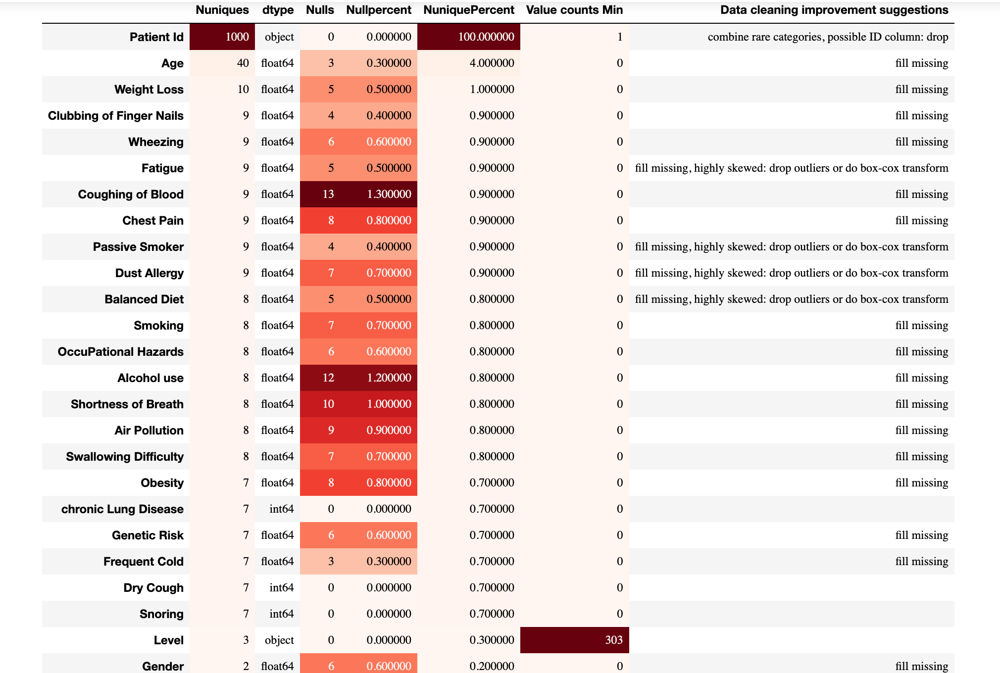

# Visualizing missing values with a heatmap

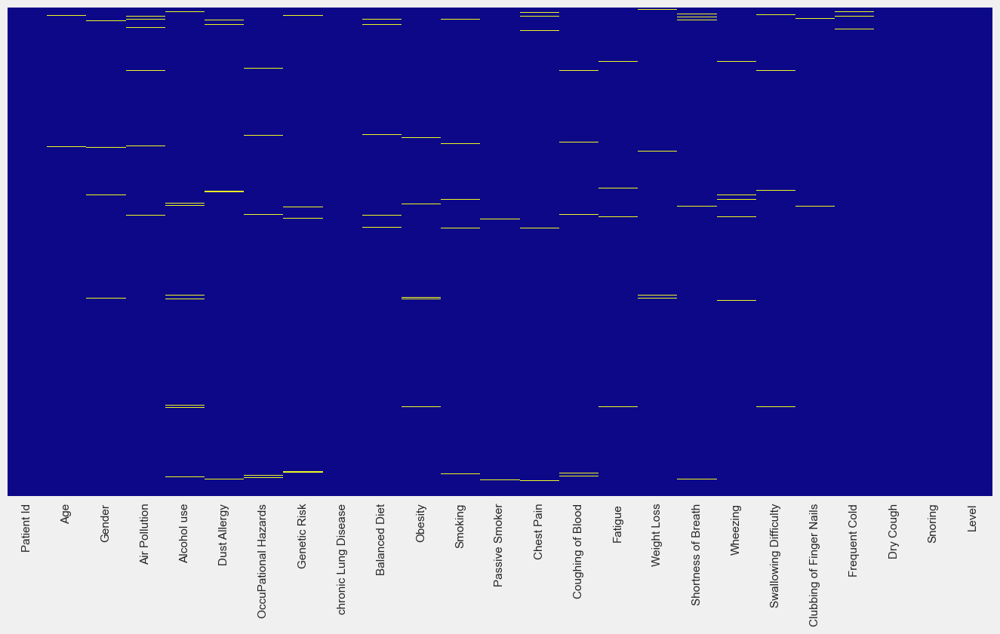

In [191]:
#Visualizing the missing values in the dataframe using a heatmap
plt.figure(figsize=(15,8))
sns.heatmap(yticklabels=False, data=df.isnull(), cbar=False, cmap="plasma")
plt.show() 

# Visulaizing outliers with a boxplot

[Text(0, 0, 'Gender'),
 Text(1, 0, 'Air Pollution'),
 Text(2, 0, 'Alcohol use'),
 Text(3, 0, 'Dust Allergy'),
 Text(4, 0, 'OccuPational Hazards'),
 Text(5, 0, 'Genetic Risk'),
 Text(6, 0, 'chronic Lung Disease'),
 Text(7, 0, 'Balanced Diet'),
 Text(8, 0, 'Obesity'),
 Text(9, 0, 'Smoking'),
 Text(10, 0, 'Passive Smoker'),
 Text(11, 0, 'Chest Pain'),
 Text(12, 0, 'Coughing of Blood'),
 Text(13, 0, 'Fatigue'),
 Text(14, 0, 'Weight Loss'),
 Text(15, 0, 'Shortness of Breath'),
 Text(16, 0, 'Wheezing'),
 Text(17, 0, 'Swallowing Difficulty'),
 Text(18, 0, 'Clubbing of Finger Nails'),
 Text(19, 0, 'Frequent Cold'),
 Text(20, 0, 'Dry Cough'),
 Text(21, 0, 'Snoring')]

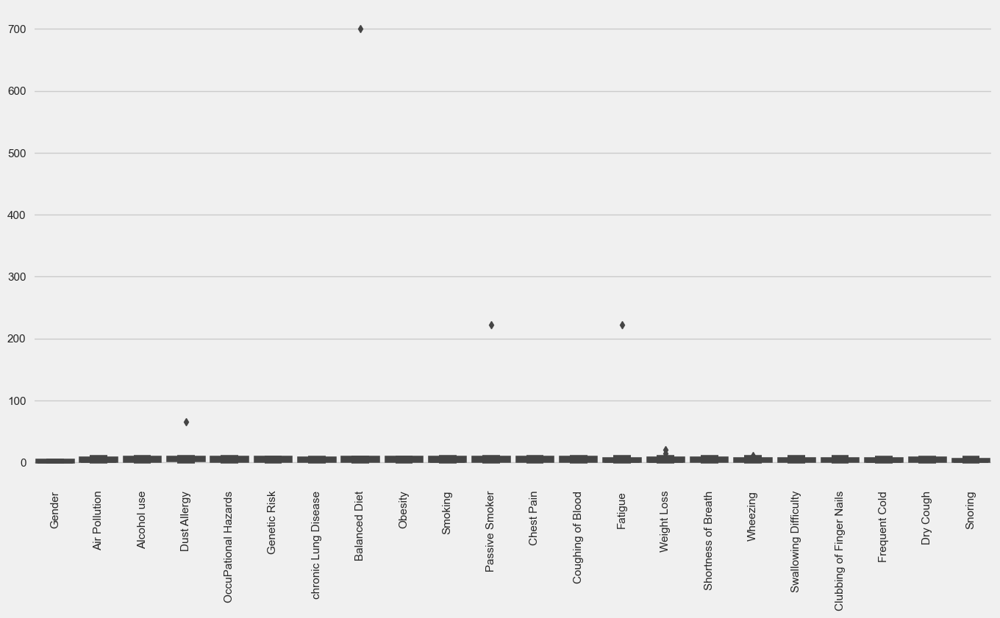

In [192]:
plt.figure(figsize=(15,8))
ax= sns.boxplot(data=df.drop(['Age', 'Level'], axis=1))
ax.set_xticklabels(ax.get_xticklabels(),rotation=90)

# Observations:
```python
   
    1. Balanced diet - Highly skewed
    2. Passive smpoker - Skewed
    3. Fatigue - Skewed
    4. Dust allergy - Slighly skewed
    5. Weight loss - Slighly skewed

    We can drop some of these
```

# After the manual analysis, lets run an Autoviz analysis on our raw dataset

1. It gives us a complete picture of our dataset icluding 
a.Pair plots of the combinations of columns in pairs
b.Distribution/ box / skewness of each of our columns



For an interactive dashboard run the below code block

In [193]:
#from autoviz.AutoViz_Class import AutoViz_Class
#AV = AutoViz_Class()
#df_av = AV.AutoViz('/Users/pree/Desktop/cancer_dataset.xlsx', verbose=1, chart_format='bokeh') 
#plt.show() 

For Autoviz svg file run below code

In [194]:
#from autoviz.AutoViz_Class import AutoViz_Class
#AV = AutoViz_Class()
#df_av = AV.AutoViz('/Users/pree/Desktop/cancer_dataset.xlsx', header=0, verbose=0, chart_format='svg') 
#plt.show() 

# 2.Distplot/ Boxplot/ Probability (skew) Plots of the whole dataset

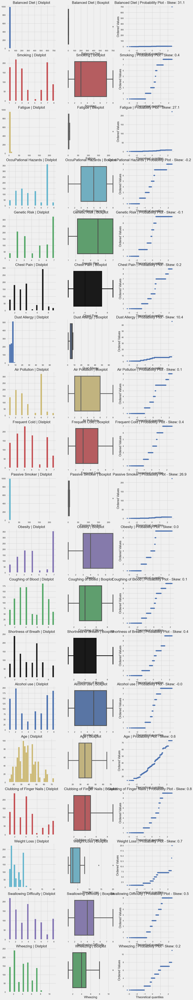

# Now after getting a solid understanding of our raw data, we can step into cleaning our data for better analysis

In [195]:
#As noticed, we will convert all our columns to lowercase to make it homogenous and easy to work with
df.columns= df.columns.str.lower()
df.columns

Index(['patient id', 'age', 'gender', 'air pollution', 'alcohol use',
       'dust allergy', 'occupational hazards', 'genetic risk',
       'chronic lung disease', 'balanced diet', 'obesity', 'smoking',
       'passive smoker', 'chest pain', 'coughing of blood', 'fatigue',
       'weight loss', 'shortness of breath', 'wheezing',
       'swallowing difficulty', 'clubbing of finger nails', 'frequent cold',
       'dry cough', 'snoring', 'level'],
      dtype='object')

In [196]:
#We will then replace all the empty spaces between the variable names with an underscore
df.columns = df.columns.str.replace(' ', '_')
df.columns

Index(['patient_id', 'age', 'gender', 'air_pollution', 'alcohol_use',
       'dust_allergy', 'occupational_hazards', 'genetic_risk',
       'chronic_lung_disease', 'balanced_diet', 'obesity', 'smoking',
       'passive_smoker', 'chest_pain', 'coughing_of_blood', 'fatigue',
       'weight_loss', 'shortness_of_breath', 'wheezing',
       'swallowing_difficulty', 'clubbing_of_finger_nails', 'frequent_cold',
       'dry_cough', 'snoring', 'level'],
      dtype='object')

In [197]:
df= df
df.head()

,patient_id,age,gender,air_pollution,alcohol_use,dust_allergy,occupational_hazards,genetic_risk,chronic_lung_disease,balanced_diet,...,fatigue,weight_loss,shortness_of_breath,wheezing,swallowing_difficulty,clubbing_of_finger_nails,frequent_cold,dry_cough,snoring,level
0,P1,33.0,1.0,2.0,4.0,5.0,4.0,3.0,2,2.0,...,3.0,4.0,2.0,2.0,3.0,1.0,2.0,3,4,Low
1,P10,17.0,1.0,3.0,1.0,5.0,3.0,4.0,2,2.0,...,1.0,3.0,7.0,8.0,6.0,2.0,1.0,7,2,Medium
2,P100,35.0,1.0,4.0,5.0,6.0,5.0,5.0,4,6.0,...,8.0,7.0,9.0,2.0,1.0,4.0,6.0,7,2,High
3,P1000,37.0,1.0,7.0,7.0,7.0,7.0,6.0,7,7.0,...,4.0,2.0,3.0,1.0,4.0,5.0,6.0,7,5,High
4,P101,46.0,1.0,6.0,8.0,7.0,7.0,7.0,6,7.0,...,3.0,NaN,4.0,1.0,4.0,2.0,4.0,2,3,High


# Observations:
 
 The data looks clean and ready for visualization

# Checking for duplicates

In [198]:
#Checking for duplicate values
df.duplicated().sum()

0

# Observations:

We do not have any duplicated values in our data

# Now that our data is structured/ deduplicated/ missing valaues and outliers identified, let's run a correlation map on our dataset. 

But in order to do that we will need to convert our target variable 'level' from categorical data to numeric data. We will achieve this by using Label Encoder from sklearn preprocessing

In [199]:
from sklearn.preprocessing import LabelEncoder

#Lets check unique values of the target variable
df['level'].unique()

array(['Low', 'Medium', 'High'], dtype=object)

In [200]:
#Intitializing Label Encoder into an object
lbl_encode= LabelEncoder()

In [201]:
lbl_encode.fit_transform(df['level'])

array([1, 2, 0, 0, 0, 0, 1, 1, 2, 2, 0, 0, 2, 0, 1, 2, 2, 0, 0, 2, 0, 0,
       0, 0, 0, 2, 2, 2, 0, 2, 0, 0, 2, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 2, 2, 2,
       2, 2, 0, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 0, 2, 2, 2, 2, 2, 2, 2, 0,
       0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 1, 2, 0, 0, 0, 1, 1, 2, 2, 0, 0, 2, 0, 1, 2, 2, 0, 0, 2, 0,
       0, 0, 0, 2, 2, 2, 2, 0, 2, 0, 0, 2, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 2, 2,
       2, 2, 2, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 2, 2, 2, 2, 2, 2, 2,
       0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 2, 1, 0, 0, 0, 1, 1, 2, 2, 0, 0, 2, 1, 1, 2, 2, 0, 0, 2,
       0, 0, 0, 0, 1, 2, 2, 2, 0, 2, 0, 0, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2,
       2, 2, 2, 2, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,

In [202]:
df['level_of_cancer']= lbl_encode.fit_transform(df['level'])

In [203]:
df['level_of_cancer'].value_counts()

0    365
2    332
1    303
Name: level_of_cancer, dtype: int64

In [204]:
#To check what values correspond to which category
df['level'].value_counts()

High      365
Medium    332
Low       303
Name: level, dtype: int64

In [205]:
df.head()

,patient_id,age,gender,air_pollution,alcohol_use,dust_allergy,occupational_hazards,genetic_risk,chronic_lung_disease,balanced_diet,...,weight_loss,shortness_of_breath,wheezing,swallowing_difficulty,clubbing_of_finger_nails,frequent_cold,dry_cough,snoring,level,level_of_cancer
0,P1,33.0,1.0,2.0,4.0,5.0,4.0,3.0,2,2.0,...,4.0,2.0,2.0,3.0,1.0,2.0,3,4,Low,1
1,P10,17.0,1.0,3.0,1.0,5.0,3.0,4.0,2,2.0,...,3.0,7.0,8.0,6.0,2.0,1.0,7,2,Medium,2
2,P100,35.0,1.0,4.0,5.0,6.0,5.0,5.0,4,6.0,...,7.0,9.0,2.0,1.0,4.0,6.0,7,2,High,0
3,P1000,37.0,1.0,7.0,7.0,7.0,7.0,6.0,7,7.0,...,2.0,3.0,1.0,4.0,5.0,6.0,7,5,High,0
4,P101,46.0,1.0,6.0,8.0,7.0,7.0,7.0,6,7.0,...,NaN,4.0,1.0,4.0,2.0,4.0,2,3,High,0


# Let's drop the old 'level' and 'patient_id' column from our dataframe

In [206]:
df.drop(['patient_id', 'level'], axis=1, inplace=True)
df.head()

,age,gender,air_pollution,alcohol_use,dust_allergy,occupational_hazards,genetic_risk,chronic_lung_disease,balanced_diet,obesity,...,fatigue,weight_loss,shortness_of_breath,wheezing,swallowing_difficulty,clubbing_of_finger_nails,frequent_cold,dry_cough,snoring,level_of_cancer
0,33.0,1.0,2.0,4.0,5.0,4.0,3.0,2,2.0,4.0,...,3.0,4.0,2.0,2.0,3.0,1.0,2.0,3,4,1
1,17.0,1.0,3.0,1.0,5.0,3.0,4.0,2,2.0,2.0,...,1.0,3.0,7.0,8.0,6.0,2.0,1.0,7,2,2
2,35.0,1.0,4.0,5.0,6.0,5.0,5.0,4,6.0,7.0,...,8.0,7.0,9.0,2.0,1.0,4.0,6.0,7,2,0
3,37.0,1.0,7.0,7.0,7.0,7.0,6.0,7,7.0,7.0,...,4.0,2.0,3.0,1.0,4.0,5.0,6.0,7,5,0
4,46.0,1.0,6.0,8.0,7.0,7.0,7.0,6,7.0,7.0,...,3.0,NaN,4.0,1.0,4.0,2.0,4.0,2,3,0


# Test 5: Correlation

# Visualizing the correlation with our target variable 'Level_of_cancer'
    1.High -0
    2.Medium -2
    3.Low -1

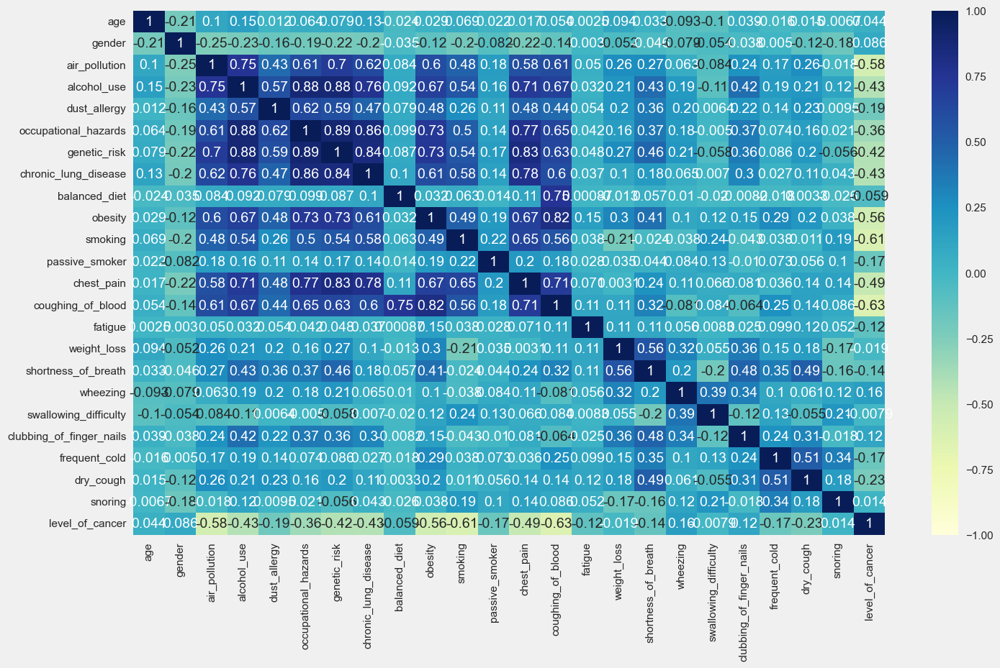

In [207]:
#Checking the correlation between our independant variables and our target variable using Correlation heatmap

plt.figure(figsize=(15, 9))
sns.heatmap(df.corr(), cmap="YlGnBu", annot=True, vmin= -1, vmax= +1)
plt.show() 

# Observations:
 From the above correlation heatmap it becomes clear that the high level_of_cancer are yellow cells (close to high=0) and if we take a treshold of +-0.5, we can select the following features as having the most impact on it

    1. Coughing_of_blood = -0.63
    2. smoking = -0.61
    3. air_pollution = -0.58
    4. obesity = -0.56


# Handling missing values


In [208]:
#Checking for the exact number of observations with null values
df.isnull().sum()
# for % of null use : the above with * 100 / len(df)

age                          3
gender                       6
air_pollution                9
alcohol_use                 12
dust_allergy                 7
occupational_hazards         6
genetic_risk                 6
chronic_lung_disease         0
balanced_diet                5
obesity                      8
smoking                      7
passive_smoker               4
chest_pain                   8
coughing_of_blood           13
fatigue                      5
weight_loss                  5
shortness_of_breath         10
wheezing                     6
swallowing_difficulty        7
clubbing_of_finger_nails     4
frequent_cold                3
dry_cough                    0
snoring                      0
level_of_cancer              0
dtype: int64

With less than 2% missing values, we will impute them with median using SimpleImputer from sklearn

In [209]:
#Imputing missing values
#from sklearn.impute import SimpleImputer
imputer = SimpleImputer(missing_values=np.nan, strategy='median')
df= pd.DataFrame(imputer.fit_transform(df), columns=df.columns)


# Re-check missing values

In [210]:
#Making sure null values are replaced with median
df.isnull().sum() 

age                         0
gender                      0
air_pollution               0
alcohol_use                 0
dust_allergy                0
occupational_hazards        0
genetic_risk                0
chronic_lung_disease        0
balanced_diet               0
obesity                     0
smoking                     0
passive_smoker              0
chest_pain                  0
coughing_of_blood           0
fatigue                     0
weight_loss                 0
shortness_of_breath         0
wheezing                    0
swallowing_difficulty       0
clubbing_of_finger_nails    0
frequent_cold               0
dry_cough                   0
snoring                     0
level_of_cancer             0
dtype: int64

# Handling outliers

Let's drop outliers from balanced diet, fatigue, passive smoker and dust allergy

In [211]:
#Dropping outlisers by setting a cap on these variables
df= df[(df['balanced_diet'] < 500)]
df= df[(df['fatigue'] < 200)]
df= df[(df['passive_smoker'] < 200)]
df= df[(df['dust_allergy'] < 60)]

df[['balanced_diet', 'fatigue', 'passive_smoker', 'dust_allergy']].describe()


,balanced_diet,fatigue,passive_smoker,dust_allergy
count,996.000000,996.000000,996.000000,996.000000
mean,4.483936,3.861446,4.198795,5.169679
std,2.132011,2.246355,2.308960,1.977848
min,1.000000,1.000000,1.000000,1.000000
25%,2.000000,2.000000,2.000000,4.000000
50%,4.000000,3.000000,4.000000,6.000000
75%,7.000000,5.000000,7.000000,7.000000
max,7.000000,9.000000,8.000000,8.000000


# Observations:

The four columns are now free of ouliers

# Let's visualize the outliers after having dropped some of them

[Text(0, 0, 'gender'),
 Text(1, 0, 'air_pollution'),
 Text(2, 0, 'alcohol_use'),
 Text(3, 0, 'dust_allergy'),
 Text(4, 0, 'occupational_hazards'),
 Text(5, 0, 'genetic_risk'),
 Text(6, 0, 'chronic_lung_disease'),
 Text(7, 0, 'balanced_diet'),
 Text(8, 0, 'obesity'),
 Text(9, 0, 'smoking'),
 Text(10, 0, 'passive_smoker'),
 Text(11, 0, 'chest_pain'),
 Text(12, 0, 'coughing_of_blood'),
 Text(13, 0, 'fatigue'),
 Text(14, 0, 'weight_loss'),
 Text(15, 0, 'shortness_of_breath'),
 Text(16, 0, 'wheezing'),
 Text(17, 0, 'swallowing_difficulty'),
 Text(18, 0, 'clubbing_of_finger_nails'),
 Text(19, 0, 'frequent_cold'),
 Text(20, 0, 'dry_cough'),
 Text(21, 0, 'snoring'),
 Text(22, 0, 'level_of_cancer')]

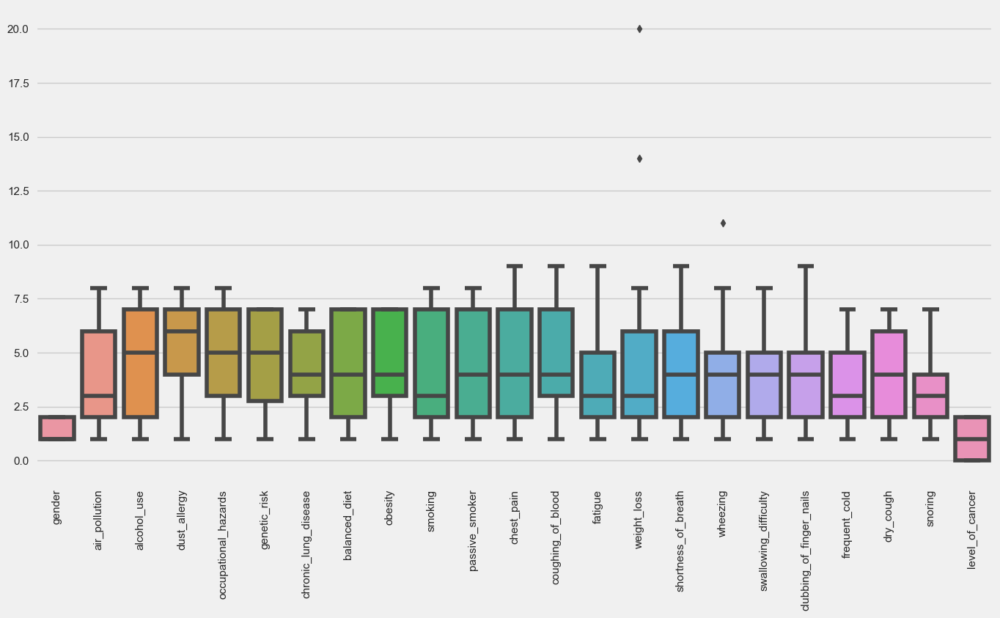

In [212]:

plt.figure(figsize=(15,8))
ax= sns.boxplot(data=df.drop(['age'], axis=1))
ax.set_xticklabels(ax.get_xticklabels(),rotation=90)


In [213]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
age,996.0,37.198795,11.998603,14.0,28.00,36.0,45.0,73.0
gender,996.0,1.398594,0.489855,1.0,1.00,1.0,2.0,2.0
air_pollution,996.0,3.831325,2.026375,1.0,2.00,3.0,6.0,8.0
alcohol_use,996.0,4.588353,2.604060,1.0,2.00,5.0,7.0,8.0
dust_allergy,996.0,5.169679,1.977848,1.0,4.00,6.0,7.0,8.0
occupational_hazards,996.0,4.839357,2.099126,1.0,3.00,5.0,7.0,8.0
genetic_risk,996.0,4.585341,2.120905,1.0,2.75,5.0,7.0,7.0
chronic_lung_disease,996.0,4.379518,1.845419,1.0,3.00,4.0,6.0,7.0
balanced_diet,996.0,4.483936,2.132011,1.0,2.00,4.0,7.0,7.0
obesity,996.0,4.480924,2.120168,1.0,3.00,4.0,7.0,7.0


# Second pandas-profiling report to display replaced missing values and thereby changes in other values such as mean/ std/skewness/Kutosis..

In [214]:
#uncomment the code and run it, to see the results
#pp.ProfileReport(df)

# Visualizing correlation after dropping Missing values and outliers

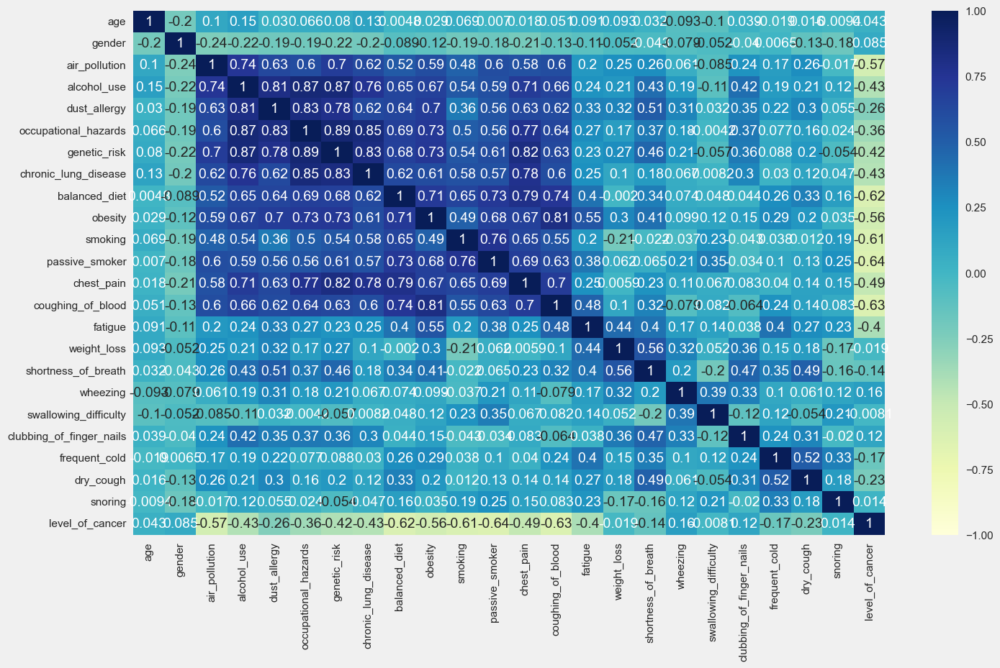

In [215]:
plt.figure(figsize=(15, 9))
sns.heatmap(df.corr(), cmap="YlGnBu", annot=True, vmin= -1, vmax= +1)
plt.show() 

# Observations:
 After dropping missing values and ouliers, we see some changes in our correlation between independent variables and dependent variable, if we set a threshold of +-0.5 with the target variable of High level of cancer, then :

    1. passive_somker = -0.64 
    2. coughing_of_blood = -0.63
    3. balanced_diet = -0.62
    3. smoking = -0.61
    4. air_pollution = -0.57
    5. obesity = -0.56


In [216]:
# Let's run another Autoviz on our clean data and set the target variable as 'level_of_cancer'

#from autoviz.AutoViz_Class import AutoViz_Class
#AV = AutoViz_Class()
#df_av = AV.AutoViz(filename='', sep=',', dfte=df, header=0, verbose=0, chart_format='svg') 
#plt.show() 

# Comparison of the Distplot/ Boxplot/ Probability (skew) Plots of the cleaned and partially normalized dataset with our previous raw dataset plots

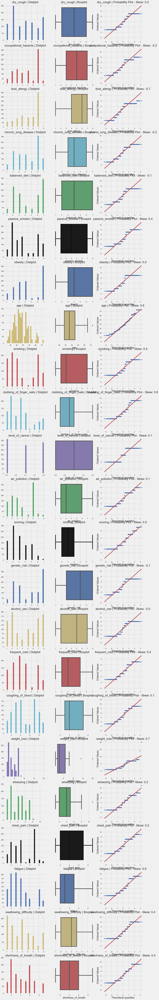

# Non-parametric tests on clean data but not normalized

# Test 1. Mann Whitney U Test on smoking and gender

In [217]:
df_mann= df[['smoking', 'gender']].copy()
df_mann['gender'] = pd.Categorical(df_mann['gender'])
group1= df.loc[df['gender'] == 1.0]
group2= df.loc[df['gender'] == 2.0]

Hypothesis:

Ho: Same distribution

H1: Different distribution

In [218]:

# Non parametric equivalent of Indepandent Sample T Test
from scipy.stats import mannwhitneyu
stat, p= mannwhitneyu(group1['smoking'], group2['smoking'])
print('Statistics=%.3f, p=%.3f' % (stat,p))
#interpret
alpha= 0.05
if p > alpha:
    print('Same distribution (fail to reject H0)')
else:
    print('Different distribution (reject H0)') 

Statistics=143396.000, p=0.000
Different distribution (reject H0)


# Test 2. Wilcoxon Sign Test on air polltuion and dry cough

In [219]:
df_wil= df[['air_pollution', 'dry_cough']].copy()

Hypothesis:

Ho: Same distribution

H1: Different distribution

In [220]:
# Non parametric equivalent of Dependent Sample T Test
from scipy.stats import wilcoxon
stat, p= wilcoxon(df_wil['air_pollution'], df_wil['dry_cough'])
print('Statistics=%.3f, p=%.3f' % (stat,p))
#interpret
alpha= 0.05
if p > alpha:
    print('Same distribution (fail to reject H0)')
else:
    print('Different distribution (reject H0)') 

Statistics=159885.500, p=0.509
Same distribution (fail to reject H0)


# Test 3. Kruskal-Wallis H-test on smoking and level of cancer

In [221]:
#Levels assigned using label encoder
#1.High -0
#2.Medium -2
#3.Low -1

df_krusk= df[['smoking', 'level_of_cancer']].copy()


#df_krusk['level_of_cancer'] = pd.Categorical(df_krusk['level_of_cancer'])

Value0= df.loc[df['level_of_cancer'] ==  0]['smoking']
Value1= df.loc[df['level_of_cancer'] ==  2]['smoking']
Value2= df.loc[df['level_of_cancer'] ==  1]['smoking'] 


Hypothesis

Ho: Same distribution

H1: Different distribution

In [222]:
from scipy.stats import kruskal
stat, p = kruskal(Value0, Value1, Value2)
print('Statistics=%.3f, p=%.3f' % (stat,p))
#interpret
alpha= 0.05
if p > alpha:
    print('Same distribution (fail to reject H0)')
else:
    print('Different distribution (reject H0)') 


Statistics=374.029, p=0.000
Different distribution (reject H0)


# Z-scores for the 6 columns of interest and the rest of the columns are not standardized

In [223]:
from sklearn.preprocessing import StandardScaler

In [224]:
scaled_data= df.copy()

In [225]:
for col in ['air_pollution', 'balanced_diet', 'obesity', 'smoking', 'passive_smoker','coughing_of_blood' ]:
    scaled_data[col] = (scaled_data[col] - scaled_data[col].mean()) / scaled_data[col].std()

In [226]:
scaled_data

,age,gender,air_pollution,alcohol_use,dust_allergy,occupational_hazards,genetic_risk,chronic_lung_disease,balanced_diet,obesity,...,fatigue,weight_loss,shortness_of_breath,wheezing,swallowing_difficulty,clubbing_of_finger_nails,frequent_cold,dry_cough,snoring,level_of_cancer
0,33.0,1.0,-0.903745,4.0,5.0,4.0,3.0,2.0,-1.165067,-0.226833,...,3.0,4.0,2.0,2.0,3.0,1.0,2.0,3.0,4.0,1.0
1,17.0,1.0,-0.410253,1.0,5.0,3.0,4.0,2.0,-1.165067,-1.170154,...,1.0,3.0,7.0,8.0,6.0,2.0,1.0,7.0,2.0,2.0
2,35.0,1.0,0.083240,5.0,6.0,5.0,5.0,4.0,0.711096,1.188149,...,8.0,7.0,9.0,2.0,1.0,4.0,6.0,7.0,2.0,0.0
3,37.0,1.0,1.563716,7.0,7.0,7.0,6.0,7.0,1.180137,1.188149,...,4.0,2.0,3.0,1.0,4.0,5.0,6.0,7.0,5.0,0.0
4,46.0,1.0,1.070224,8.0,7.0,7.0,7.0,6.0,1.180137,1.188149,...,3.0,3.0,4.0,1.0,4.0,2.0,4.0,2.0,3.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,44.0,1.0,1.070224,7.0,7.0,7.0,7.0,6.0,1.180137,1.188149,...,5.0,3.0,2.0,7.0,8.0,2.0,4.0,5.0,3.0,0.0
996,37.0,2.0,1.070224,8.0,7.0,7.0,7.0,6.0,1.180137,1.188149,...,9.0,6.0,5.0,7.0,2.0,4.0,3.0,1.0,4.0,0.0
997,25.0,2.0,0.083240,5.0,6.0,5.0,5.0,4.0,0.711096,1.188149,...,8.0,7.0,9.0,2.0,1.0,4.0,6.0,7.0,2.0,0.0
998,18.0,2.0,1.070224,8.0,7.0,7.0,7.0,6.0,1.180137,1.188149,...,3.0,2.0,4.0,1.0,4.0,2.0,4.0,2.0,3.0,0.0


# Let's check some of the variables on the level of cancer

# Level of cancer distribution

[Text(0, 0, 'High'), Text(1, 0, 'Medium'), Text(2, 0, 'Low')]

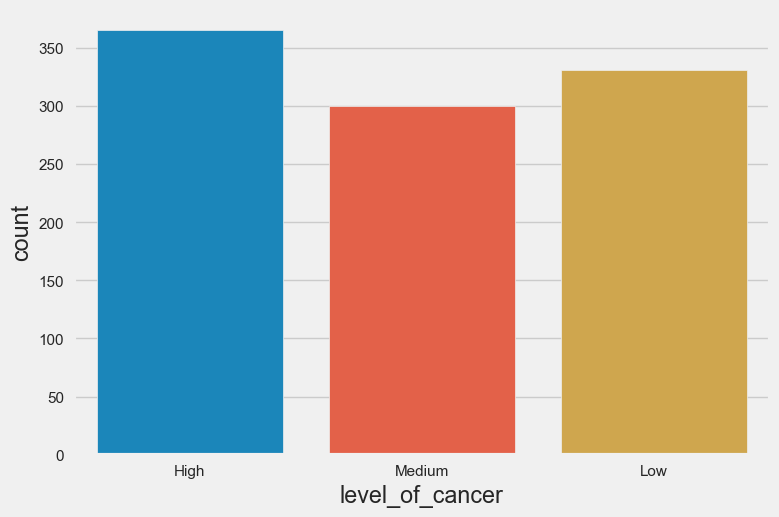

In [227]:
sns.countplot(data=scaled_data, x='level_of_cancer').set_xticklabels(['High','Medium','Low',])

# Observations:

As is seen the data is fairly distributed. We could try to split them based on gender to see if there is any significant difference

# Gender distribution

<AxesSubplot:xlabel='gender', ylabel='count'>

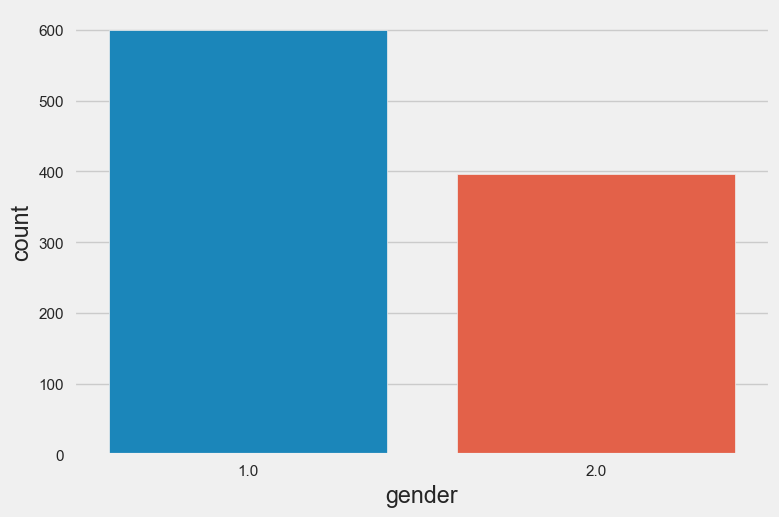

In [228]:
sns.countplot(data=scaled_data, x='gender')

# Observations:

It appears that there is some differencve between the two genders. We could use Cohen's method to check the effectsize

# Parametric tests on normalized data

# Test 1: Cohen's h test on Gender to determine the effectsize

Let's use Cohen's h instead of Cohen's d method to check the effect size on gender, as this is a binomial distribution (Gender = 1.0 or 2.0)

In [229]:
#Lets get gender proportions 
gender_split=scaled_data.gender.value_counts()
gender_sum=scaled_data.gender.sum()
gender_prop = gender_split/ gender_sum

gender1_prop= gender_prop[1.0]
gender2_prop= gender_prop[2.0]

#Set expected proportion to 0.5
exp_prop= 0.5

In [230]:
#import package from library
from statsmodels.stats.proportion import proportion_effectsize

In [231]:
#lets calculate the h2 for gender1 and gender2, respectively

h2_gender1=proportion_effectsize(gender1_prop, exp_prop)
h2_gender1

-0.14044691441669332

In [232]:
#Convert h2 to h for gender1
cohenh_gen1= h2_gender1 * 2**0.5
cohenh_gen1

-0.1986219311615411

In [233]:
h2_gender2=proportion_effectsize(gender2_prop, exp_prop)
h2_gender2

-0.444500728347865

In [234]:
#Convert h2 to h for gender2
cohenh_gen2= h2_gender2 * 2**0.5
cohenh_gen2

-0.6286189585142696

![](Screen%20Shot%202022-11-01%20at%2013.22.40.png)

# Observations:

1. Cohen's h for binomial gender 1.0 = -0.1986219311615411 = SMALL EFFECT

2. Cohen's h for binomial gender 2.0 = -0.6286189585142696 = MEDIUM EFFECT

# Level of cancer distribution based on gender

[Text(0, 0, 'High'), Text(1, 0, 'Medium'), Text(2, 0, 'Low')]

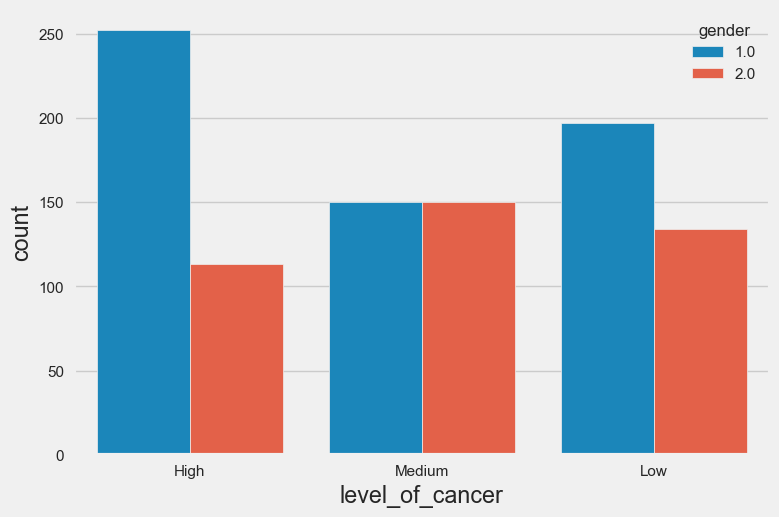

In [235]:
sns.countplot(data=scaled_data, x='level_of_cancer', hue='gender').set_xticklabels(['High', 'Medium', 'Low'])

# Observations:

As we already have seen with Cohen's h method, although we see that with the 'high' level of cancer, the difference looks significant, we can conclude with the calculation that it only has a medium effect on our study.

# Level of cancer and age 

[Text(0, 0, 'High'), Text(1, 0, 'Medium'), Text(2, 0, 'Low')]

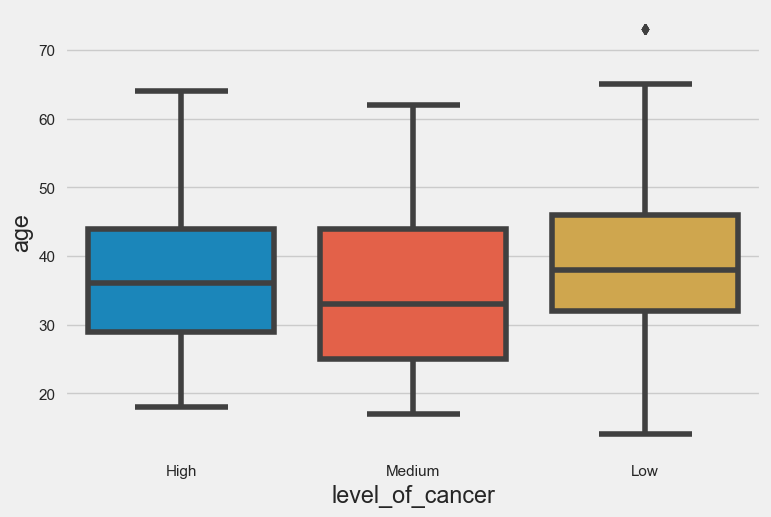

In [236]:
sns.boxplot(data=scaled_data, y='age', x= 'level_of_cancer').set_xticklabels(['High', 'Medium','Low'])

# Observations:

It looks like high/medium and low all fall within the same range and so it seems like age does not play a significant role in the level of cancer

# Test 2: Cohen's D for one-sample test on age to determine the effectsize

In [237]:
# Mean of age column
mean_samp= scaled_data['age'].mean()
mean_samp

37.19879518072289

In [238]:
# Setting hypothesized mean to 40
mean_hyp= 40

In [239]:
# Determine the difference between our mean and the hypothesized mean
d = mean_samp - mean_hyp
d

-2.8012048192771104

In [240]:
# Lets get the standard deviation of our age column
sd= scaled_data['age'].std()
sd

11.998602873199886

In [241]:
# cohen d= difference in mean/ std
cohenD_os = d / sd
cohenD_os

-0.23346091614832004

We can multiply this by square root for the qualification

In [242]:
# we will only consider absolute values, so negative can be omitted
cohenD= cohenD_os * 2**0.5
#cohenD

print('.:. The effect size from CohensD method:'+'\033[1m {:.2f}%'.format(cohenD)+' .:.')

.:. The effect size from CohensD method: -0.33% .:.


![](Screen%20Shot%202022-11-01%20at%2013.23.44.png)

# Observations:

Cohen's d one-sample test for effectsize of age = -0.33016359390100214 = SMALL EFFECT, which is also clear from the visualization in the previous block of seaborn plot

# Test 3 : One-way ANOVA analysis on level of cancer and air pollution

H0= There is no effect of air pollution on the level of cancer

H1= There is an effect of air pollution on the level of cancer

3A. Using statsmodel

In [243]:
# Import statsmodels api
import statsmodels.api as sm

In [244]:
# Import ols (orinary least squares model)
from statsmodels.formula.api import ols

In [245]:
# fit the model
model1= ols('level_of_cancer~air_pollution', data= scaled_data).fit()

In [247]:
#1 way anova result
aov1 = sm.stats.anova_lm(model1, typ=2)
aov1

,sum_sq,df,F,PR(>F)
air_pollution,226.856362,1.0,481.844908,2.153298e-87
Residual,467.982996,994.0,NaN,NaN


3B. Using pingouin method

[Text(0, 0, 'High'), Text(1, 0, 'Medium'), Text(2, 0, 'Low')]

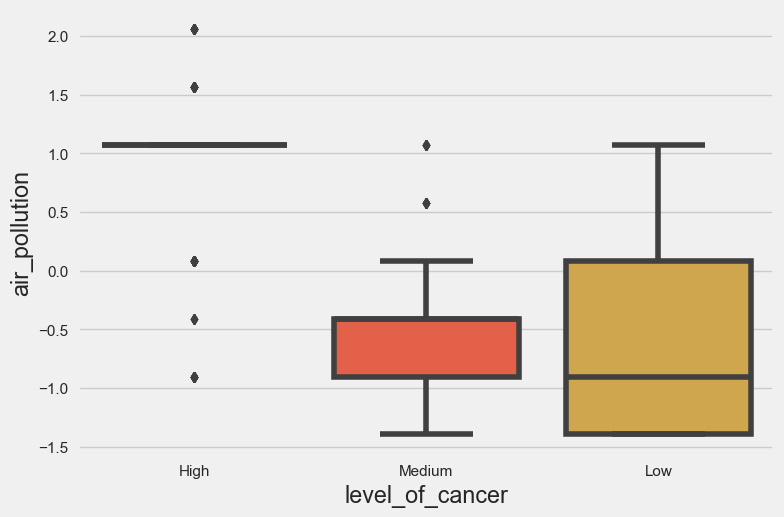

In [249]:
sns.boxplot(data=scaled_data, y='air_pollution', x= 'level_of_cancer').set_xticklabels(['High', 'Medium','Low'])

# Observations:

 As is noticed, the p-value associated with F statistic is < 0.05 and therefore we can safely reject our H0 in favor of H1

# Test 4: Two-way ANOVA with coughing of blood and smoking on level of cancer

Coughing of blood:

    H0= There is no effect of coughing of blood on the level of cancer
    H1= There is an effect of coughing of blood on the level of cancer

Smoking:

    H0= There is no effect of smoking on the level of cancer
    H1= There is an effect of smoking on the level of cancer

Relationship between coughing of blood and Smoking:

    H0= There is no relationship between coughing of blood and smoking on the level of cancer
    H1= There is a relationship between coughing of blood and smoking on the level of cancer
 

As we have already imported statsmodel api, we will go ahead and fit the new model as model2

In [103]:
# fit the model
model2= ols('level_of_cancer ~ coughing_of_blood+smoking+coughing_of_blood*smoking', data= scaled_data).fit()

In [104]:
#two-way anova result
aov2 = sm.stats.anova_lm(model2, typ=2)
aov2

,sum_sq,df,F,PR(>F)
coughing_of_blood,85.737519,1.0,243.156305,3.391920e-49
smoking,69.277113,1.0,196.473692,7.365462e-41
coughing_of_blood:smoking,0.218153,1.0,0.618694,4.317208e-01
Residual,349.781671,992.0,NaN,NaN


# Observations:

1. Air pollution :  As is noticed, the p-value associated with F statistic is < 0.05 and therefore we can safely reject our H0 in favor of H1

2. Smoking :  As is noticed, the p-value associated with F statistic is < 0.05 and therefore we can safely reject our H0 in favor of H1

3. Relationship between air pollution and smoking :  As is noticed, the p-value associated with F statistic is < 0.05 and therefore we can safely reject our H0 in favor of H1

# Feature Selection with 6 standardized independent variables and one unstandardized target variable for machine learning

In [105]:
#Creating a new dataframe with just 6 standardized columns of interest and the target variable
df_of_interest= scaled_data[['air_pollution', 'obesity', 'smoking', 'coughing_of_blood','passive_smoker', 'balanced_diet', 'level_of_cancer']]
df_of_interest.head()

,air_pollution,obesity,smoking,coughing_of_blood,passive_smoker,balanced_diet,level_of_cancer
0,-0.903745,-0.226833,-0.380079,-0.357088,-0.952288,-1.165067,1.0
1,-0.410253,-1.170154,-0.781521,-0.771128,-0.086097,-1.165067,2.0
2,0.083240,1.188149,-0.781521,1.299070,-0.519193,0.711096,0.0
3,1.563716,1.188149,1.225685,1.299070,1.213189,1.180137,0.0
4,1.070224,1.188149,1.627126,1.713110,1.213189,1.180137,0.0


# Let's visualize pair plots of our dataframe of interest  to re-confirm the correlation of selected 6 columns

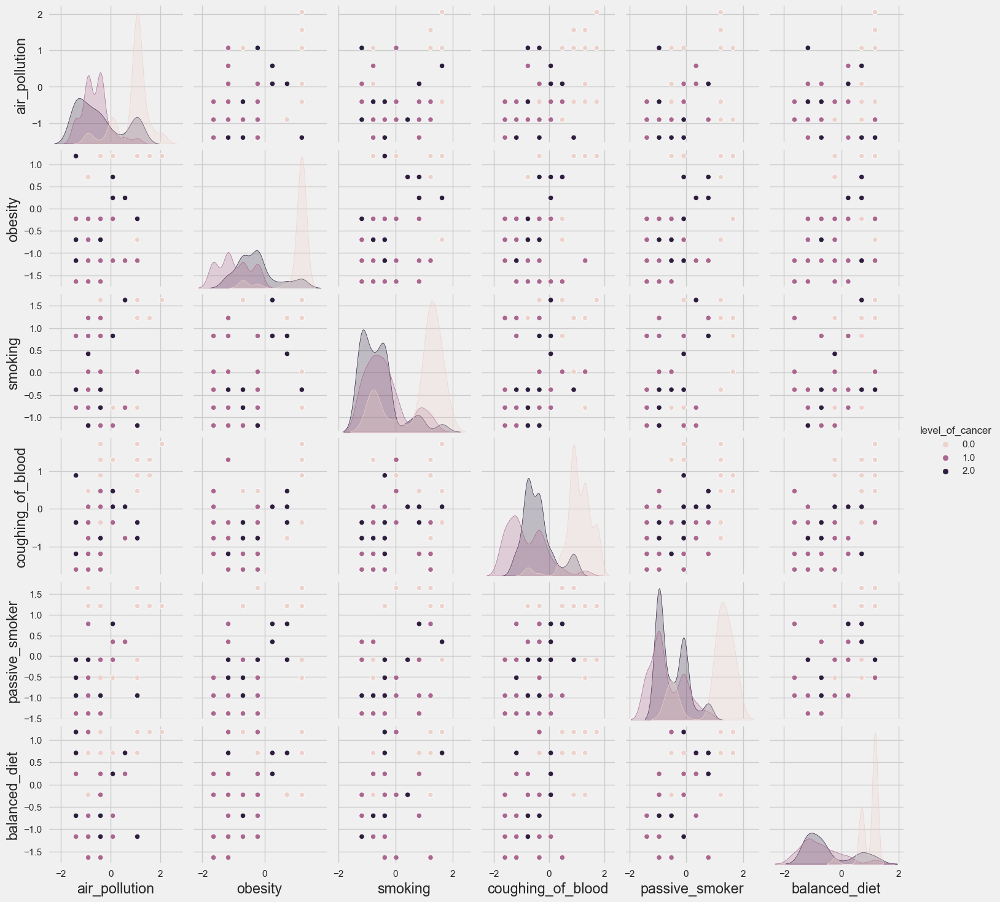

In [248]:
sns.pairplot(data= df_of_interest, hue='level_of_cancer')

In [107]:
# Re-confirm that the data is clean and ready to be used for machine learning

from autoviz import data_cleaning_suggestions
data_cleaning_suggestions(df_of_interest)
plt.figure(figsize = (10, 5))

Imported v0.1.58. After importing, execute '%matplotlib inline' to display charts in Jupyter.
    AV = AutoViz_Class()
    dfte = AV.AutoViz(filename, sep=',', depVar='', dfte=None, header=0, verbose=1, lowess=False,
               chart_format='svg',max_rows_analyzed=150000,max_cols_analyzed=30, save_plot_dir=None)
Update: verbose=0 displays charts in your local Jupyter notebook.
        verbose=1 additionally provides EDA data cleaning suggestions. It also displays charts.
        verbose=2 does not display charts but saves them in AutoViz_Plots folder in local machine.
        chart_format='bokeh' displays charts in your local Jupyter notebook.
        chart_format='server' displays charts in your browser: one tab for each chart type
        chart_format='html' silently saves interactive HTML files in your local machine
Data cleaning improvement suggestions. Complete them before proceeding to ML modeling.


,Nuniques,dtype,Nulls,Nullpercent,NuniquePercent,Value counts Min,Data cleaning improvement suggestions
coughing_of_blood,9,float64,0,0.000000,0.903614,0,
air_pollution,8,float64,0,0.000000,0.803213,0,
smoking,8,float64,0,0.000000,0.803213,0,
passive_smoker,8,float64,0,0.000000,0.803213,0,
obesity,7,float64,0,0.000000,0.702811,0,
balanced_diet,7,float64,0,0.000000,0.702811,0,
level_of_cancer,3,float64,0,0.000000,0.301205,0,


<Figure size 1000x500 with 0 Axes>

# Split data into train and test sets



First, the data will be split so we can train a scaler model to apply to an unknwon (test) data set. We will save 25% of the data for testing.


In [109]:
from sklearn.model_selection import train_test_split

x_train,x_test,y_train,y_test = train_test_split(df_of_interest.drop(['level_of_cancer'], axis=1), df_of_interest['level_of_cancer'],test_size=0.25, random_state=0)

#Checking the shapes
print("x_train shape :",x_train.shape)
print("y_train shape :",y_train.shape)
print("x_test shape :",x_test.shape)
print("y_test shape :",y_test.shape)

x_train shape : (747, 6)
y_train shape : (747,)
x_test shape : (249, 6)
y_test shape : (249,)


# Logistic regression

In [110]:
from sklearn.linear_model import LogisticRegression

from sklearn.linear_model import LogisticRegression
lr = LogisticRegression()
lr.fit(x_train, y_train) #Fitting
y_lr = lr.predict(x_test)



In [111]:
from sklearn.metrics import accuracy_score, classification_report
score_LR = accuracy_score(y_test, y_lr)
print('.:. Logistic Regression Accuracy:'+'\033[1m {:.2f}%'.format(score_LR*100)+' .:.')

.:. Logistic Regression Accuracy: 83.13% .:.
